In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from distinctipy import distinctipy

In [2]:
# load data 
df  = pd.read_parquet("../bldb/clean/csv/bldb_dset.parquet")
sbl = df[df.bla_class.str.contains("class_a|class_c|class_d")]
mbl = df[df.bla_class.str.contains("class_b1|class_b2|class_b3")]

# load tsne
tsne_sbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_sbl_all_models.csv")
tsne_mbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_mbl_all_models.csv")

# merge 
sbl = sbl.merge(tsne_sbl, on="seq_id", how="inner")
mbl = mbl.merge(tsne_mbl, on="seq_id", how="inner")

# split
sbl_a = sbl[sbl.bla_class == "class_a"]
sbl_c = sbl[sbl.bla_class == "class_c"]
sbl_d = sbl[sbl.bla_class == "class_d"]
mbl_me = mbl[mbl.bla_class.str.contains("class_b3")]
mbl_mb = mbl[~mbl.bla_class.str.contains("class_b3")]

# print info
print(sbl.columns.to_list())

# a plot fx 
def do_iscatter(df, x, y, hue, hover_name, hover_data):

    # plot
    fig = px.scatter(df, x=x, y=y,
    height=500, width=600, color=hue,
    hover_name=hover_name, 
    color_discrete_sequence=px.colors.qualitative.Plotly,
    hover_data=hover_data
    )

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

['#name', 'seq', 'length', 'filename', 'bla_class', 'protein_name', 'protein_family_filename', 'superfamily', 'protein_family', 'top_fam', 'seq_id', 'ambler_class', 'alternative_protein_name', 'subfamily', 'genpept_id', 'genbank_id', 'pubmed_id', 'seq_url', 'pdb_structures', 'mutants', 'phenotype', 'functional_info', 'source', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species', 'phylo_group', 'phylo_group_genus', 'phylo_group_sp', 'bla_subclass', 'esm1b', 'esm2_650m', 'esm2_3b', 'carp', 't5xlu50', 'molecular_weight', 'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet', 'pass_the_filter', 'is_clust_rep_30', 'is_clust_rep_60', 'is_clust_rep_90', 'has_af2_model', 'model', 'mean_plddt', 'resid_plddt', 'entryId', 'gene', 'uniprotAccession', 'uniprotId', 'uniprotDescription', 'taxId', 'organismScientificName', 'uniprotStart', 'uniprotEnd', 'modelCreatedDate', 'latestVersion', 'allVersions', 'isReviewed', 'isReferenceProt

In [3]:
print(len(sbl))
print(len(sbl[sbl.protein_family == "Unknown"]))

25961
11133


In [4]:
print(len(mbl))
print(len(mbl[mbl.protein_family == "Unknown"]))

3468
1683


In [17]:
def get_percent_diversity(df, hue):
    
    # Unknown percent
    unknowns = (df[hue] == "Unknown").mean() * 100
    print(f"Unknown percent: {unknowns:.2f}%")

    # remove Unknown seqs and get the top10 most abundant fams
    subset = df[df[hue] != "Unknown"]
    top = subset[hue].value_counts().nlargest(10)

    # get the percentage for each fam in top10 
    top_percentage = (top / len(subset)) * 100
    print("\nTop 10 most abundant enzyme families:")
    print(top_percentage)

    # get the percentage of the total top10
    total_top_percentage = top_percentage.sum()
    print(f"\nThe top10 represent: {total_top_percentage:.2f}%")

In [18]:
get_percent_diversity(sbl, "protein_family")

Unknown percent: 42.88%

Top 10 most abundant enzyme families:
protein_family
OXA      28.028055
EC       15.389803
PDC       4.093607
BcI       3.931751
ADC       3.115727
CTX-M     3.014567
BcIII     2.974103
TEM       2.913407
SHV       2.461559
ACT       1.861343
Name: count, dtype: float64

The top10 represent: 67.78%


In [19]:
get_percent_diversity(mbl, "protein_family")

Unknown percent: 48.53%

Top 10 most abundant enzyme families:
protein_family
CphA    23.977591
BcII    10.980392
SER      8.851541
L1       6.834734
IMP      5.770308
VIM      5.546218
NDM      4.369748
BJP      3.249300
GOB      3.249300
IND      2.577031
Name: count, dtype: float64

The top10 represent: 75.41%


In [21]:
get_percent_diversity(sbl_a, "protein_family")

Unknown percent: 60.04%

Top 10 most abundant enzyme families:
protein_family
BcI      9.947108
CTX-M    7.626685
BcIII    7.524313
TEM      7.370756
SHV      6.227606
L2       3.907183
PC1      3.719502
PenB     3.429449
KPC      3.344139
CGA      3.122334
Name: count, dtype: float64

The top10 represent: 56.22%


In [22]:
get_percent_diversity(sbl_c, "protein_family")

Unknown percent: 33.15%

Top 10 most abundant enzyme families:
protein_family
EC     50.509075
PDC    13.435148
ADC    10.225764
ACT     6.108898
CMY     5.378486
SRT     1.527224
YEC     1.394422
MIR     1.239486
Ear     1.150952
DHA     0.951749
Name: count, dtype: float64

The top10 represent: 91.92%


In [24]:
get_percent_diversity(sbl_d, "protein_family")

Unknown percent: 1.92%

Top 10 most abundant enzyme families:
protein_family
OXA    93.414250
CDD     3.551360
BPU     1.033940
BSD     1.011463
BSU     0.224770
BAD     0.112385
BAT     0.112385
BOC     0.112385
BED     0.067431
BEN     0.067431
Name: count, dtype: float64

The top10 represent: 99.71%


In [26]:
get_percent_diversity(mbl_mb, "protein_family")

Unknown percent: 34.56%

Top 10 most abundant enzyme families:
protein_family
CphA    37.478109
BcII    17.162872
IMP      9.019264
VIM      8.669002
NDM      6.830123
IND      4.028021
BlaB     3.677758
CfiA     1.838879
CGB      1.313485
PFM      1.138354
Name: count, dtype: float64

The top10 represent: 91.16%


In [27]:
get_percent_diversity(mbl_me, "protein_family")

Unknown percent: 62.68%

Top 10 most abundant enzyme families:
protein_family
SER     24.572317
L1      18.973561
BJP      9.020218
GOB      9.020218
THIN     6.842924
RM3      5.598756
CSR      3.888025
CAR      2.332815
ESP      1.866252
POM      1.710731
Name: count, dtype: float64

The top10 represent: 83.83%


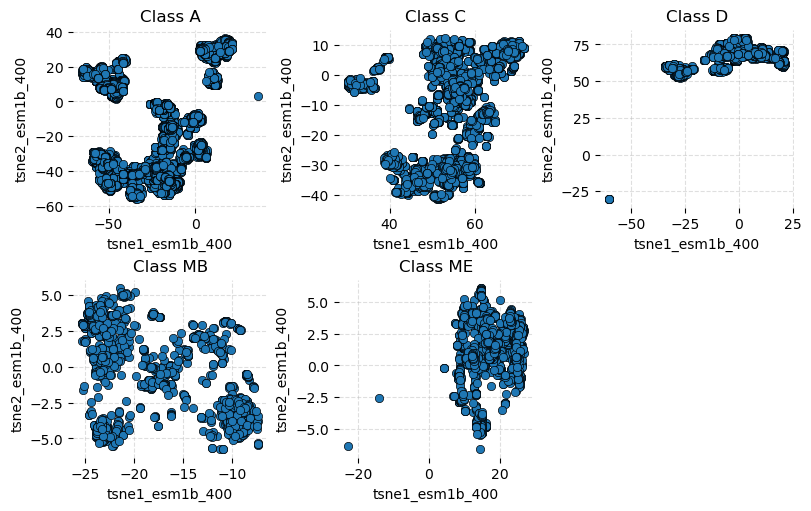

In [16]:
mosaic = """
    ABC
    DE.
"""
x = "tsne1_esm1b_400"
y = "tsne2_esm1b_400"

ax = plt.figure(figsize=(8,5), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(sbl_a,  x=x, y=y, edgecolor="k", ax=ax["A"])
sns.scatterplot(sbl_c,  x=x, y=y, edgecolor="k", ax=ax["B"])
sns.scatterplot(sbl_d,  x=x, y=y, edgecolor="k", ax=ax["C"])
sns.scatterplot(mbl_mb, x=x, y=y, edgecolor="k", ax=ax["D"])
sns.scatterplot(mbl_me, x=x, y=y, edgecolor="k", ax=ax["E"])

ax["A"].set_title(f"Class A")
ax["B"].set_title(f"Class C")
ax["C"].set_title(f"Class D")
ax["D"].set_title(f"Class MB")
ax["E"].set_title(f"Class ME")

for i in "ABCDE":
    ax[i].grid(alpha=0.4, linestyle="--")
    ax[i].set_frame_on(False)
    ax[i].set_axisbelow(True)

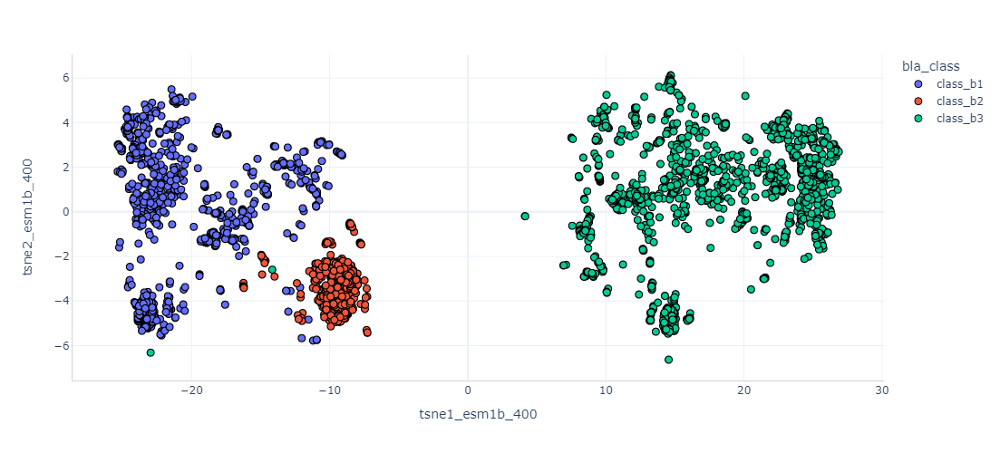

In [17]:
# explore outliers 
do_iscatter(
    df=mbl, 
    x="tsne1_esm1b_400", y="tsne2_esm1b_400", 
    hue="bla_class", 
    hover_name="protein_name", hover_data=["#name", "seq_id"])

In [18]:
# outliers 
out_a = sbl_a[sbl_a["#name"].str.contains("AFAM6914-2")].seq_id.to_list()
out_d = sbl_d[~(sbl_d.tsne1_esm1b_400.between(-40,30))].seq_id.to_list()
out_sbl = out_a + out_d

out_mbl = mbl_me[~(mbl_me.tsne1_esm1b_400.between(0,30))].seq_id.to_list()

# rename bla_class
sbl["bla_class"] = sbl.apply(lambda row: "outlier" if row["seq_id"] in out_sbl else row["bla_class"], axis=1)
mbl["bla_class"] = mbl.apply(lambda row: "outlier" if row["seq_id"] in out_mbl else row["bla_class"], axis=1)

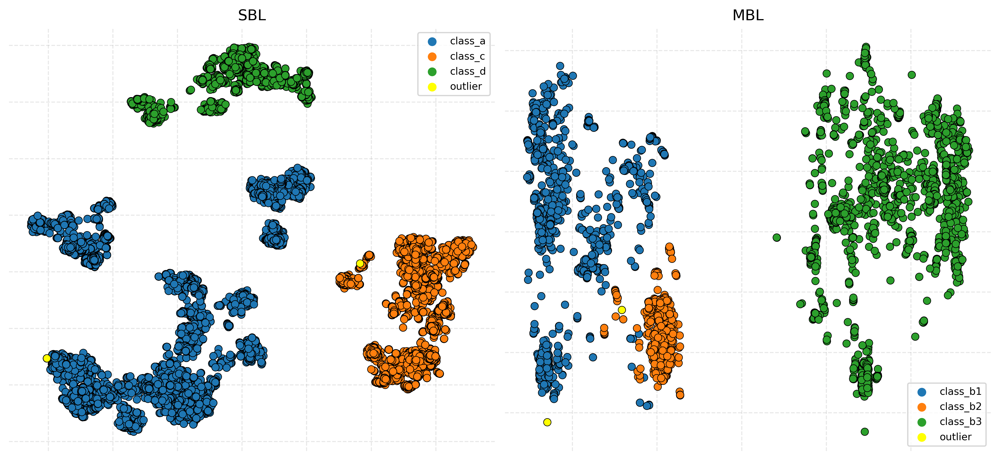

In [19]:
mosaic = """
    AB
"""
x = "tsne1_esm1b_400"
y = "tsne2_esm1b_400"
hue = "bla_class"

# cutom palette 
palette = sns.color_palette("tab10", n_colors=3)
palette.append((1, 1, 0))

ax = plt.figure(figsize=(11,5), constrained_layout = True, dpi=400).subplot_mosaic(mosaic) 
sns.scatterplot(sbl.sort_values(hue),  x=x, y=y,hue=hue,edgecolor="k", palette=palette,ax=ax["A"])
sns.scatterplot(mbl.sort_values(hue),  x=x, y=y,hue=hue,edgecolor="k", palette=palette,ax=ax["B"])

ax["A"].set_title(f"SBL")
ax["B"].set_title(f"MBL")

for i in "AB":
    ax[i].grid(alpha=0.3, linestyle="--")
    ax[i].set_frame_on(False)
    ax[i].set_axisbelow(True)
    ax[i].legend(frameon=True, fontsize=8)
    ax[i].set_yticklabels([])
    ax[i].set_xticklabels([])
    ax[i].set_ylabel("")
    ax[i].set_xlabel("")
    ax[i].tick_params(axis='both', colors='w')
    ax[i].set_axisbelow(True)

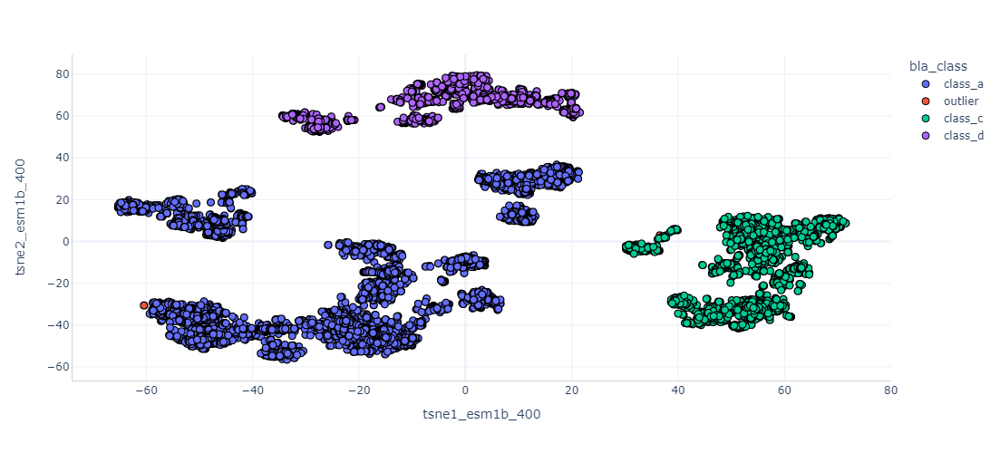

In [20]:
do_iscatter(
    df=sbl, 
    x="tsne1_esm1b_400", y="tsne2_esm1b_400", 
    hue="bla_class", 
    hover_name="protein_name", hover_data=["#name", "seq_id"])

In [21]:
sbl[sbl.bla_class == "outlier"]

,#name,seq,length,filename,bla_class,protein_name,protein_family_filename,superfamily,protein_family,top_fam,...,tsne1_t5xlu50_600,tsne2_t5xlu50_600,tsne1_t5xlu50_700,tsne2_t5xlu50_700,tsne1_t5xlu50_800,tsne2_t5xlu50_800,tsne1_t5xlu50_900,tsne2_t5xlu50_900,tsne1_t5xlu50_1000,tsne2_t5xlu50_1000
6480,WP_105000841.1|AFAM6914-2| class A beta-lactamase,MPKTPNMKKTGLLLILFTLLYSCKDYTEQDLQSGAVFEQELEELKS...,757,A-AFAM6914-2-prot.fasta,outlier,AFAM6914-2,AFAM6914,SBL,Unknown,Unknown,...,-52.496518,12.712511,-49.430945,11.669094,-43.273834,6.559464,-44.522274,11.028368,-40.932895,11.779755
23030,WP_017546425.1|OXA-D1043| Nocardiopsis prasina...,MRTDTEHAPGRSGRAPGRFALGAAGCAITLFSGAACATTDEPEPAQ...,296,D-OXA-D1043-prot.fasta,outlier,OXA-D1043,OXA,SBL,OXA,OXA,...,-41.291331,-42.845739,-40.589873,-36.545237,-37.450589,-34.255740,-36.158748,-32.643838,-34.292695,-30.865168
23031,WP_017584377.1|OXA-D1044| Nocardiopsis vallifo...,MRTDTERATARPGRAPGLFAVGAAGCAITLLAGAACGGSEEENGPD...,297,D-OXA-D1044-prot.fasta,outlier,OXA-D1044,OXA,SBL,OXA,OXA,...,-41.332511,-42.902353,-40.652018,-36.592103,-37.517405,-34.312264,-36.233308,-32.703358,-34.372384,-30.925995
23032,WP_017589176.1|OXA-D1045| Nocardiopsis ganjiah...,MRTDTEHAPGRPGRAPGRFAVGAVGCAITLFAGTACGGAEEDSGAA...,297,D-OXA-D1045-prot.fasta,outlier,OXA-D1045,OXA,SBL,OXA,OXA,...,-41.286770,-42.885174,-40.595565,-36.588430,-37.454863,-34.301543,-36.164630,-32.690788,-34.299212,-30.916119
23035,WP_026117807.1|OXA-D1048| Nocardiopsis alkalip...,MRTDTEPAPRPSRARSRFGAAGGALLLLAGVACGGAEEEEGPVAER...,301,D-OXA-D1048-prot.fasta,outlier,OXA-D1048,OXA,SBL,OXA,OXA,...,-41.322342,-42.861144,-40.627084,-36.552592,-37.493348,-34.267013,-36.206673,-32.655369,-34.345594,-30.874579
23043,WP_049570325.1|OXA-D1055| Nocardiopsis sp. SBT366,MRTDTEHAPGRSGRATGRFALGAAGCAITLFTGAACATTDEPEPAQ...,296,D-OXA-D1055-prot.fasta,outlier,OXA-D1055,OXA,SBL,OXA,OXA,...,-41.293573,-42.832515,-40.587337,-36.529095,-37.449134,-34.237893,-36.156399,-32.624915,-34.290032,-30.845370
23061,WP_067606674.1|OXA-D1071| Nocardiopsis listeri...,MRIDTATIRSPRTARFALAATGSVLTLVAGIACSGGEAEPEVDRPD...,302,D-OXA-D1071-prot.fasta,outlier,OXA-D1071,OXA,SBL,OXA,OXA,...,-41.302520,-42.834797,-40.596198,-36.528886,-37.458370,-34.240145,-36.165700,-32.628680,-34.299308,-30.849566
23521,MBB5495573.1|OXA-D1558| class D beta-lactamase,MRTDTERATARPGRAPGLFAVGAAGCAITLLAGAACGGSEEDNGPD...,297,D-OXA-D1558-prot.fasta,outlier,OXA-D1558,OXA,SBL,OXA,OXA,...,-41.304025,-42.912310,-40.624202,-36.609917,-37.485479,-34.327090,-36.197552,-32.717757,-34.338670,-30.943267


In [22]:
for idx in sbl[sbl.bla_class == "outlier"].index:
    prot_name = sbl.loc[idx, '#name']
    af_model  = sbl.loc[idx, 'model']
    print(f"name:{prot_name} ... {af_model}")

name:WP_105000841.1|AFAM6914-2| class A beta-lactamase ... None
name:WP_017546425.1|OXA-D1043| Nocardiopsis prasina DSM 43845 ... None
name:WP_017584377.1|OXA-D1044| Nocardiopsis valliformis DSM 45023 ... None
name:WP_017589176.1|OXA-D1045| Nocardiopsis ganjiahuensis DSM 45031 ... None
name:WP_026117807.1|OXA-D1048| Nocardiopsis alkaliphila YIM 80379 ... None
name:WP_049570325.1|OXA-D1055| Nocardiopsis sp. SBT366 ... None
name:WP_067606674.1|OXA-D1071| Nocardiopsis listeri NBRC 13360 ... None
name:MBB5495573.1|OXA-D1558| class D beta-lactamase ... AF-A0A840WJC3-F1-model_v4.pdb


In [23]:
sbl.loc[6480, 'seq']

'MPKTPNMKKTGLLLILFTLLYSCKDYTEQDLQSGAVFEQELEELKSFYEIPGMSALIARGDEVVFEKQWGFADWEMSRNVQANTEFPIASITKLYSAALVLKMTEKGVLDLNKSVTSYLPEFQIDKSIQLKHLLSHSSEGQIGKQFHYSRRFGLLSAVLEKATGEPFDQLLQKEILEPLQTENTYFLKNDIQVARRRDQFAFPFNFNGSAEPGRVEFGFSSSAGLAANPQELLRFSQALDNNSLLSSSSRTELFRGISEDLPYAYGLFKQKIEGLDVYWVYGQYDSYSSLLIKVPERDLHLVLLANNNHLSDPARLIMGDLESSLFALSFLKNYLFDQTDTPLDPNPSAPVNTSLEQKIQLARALGESFMSRYREEDWQAAKSRLHGLFKTESLAHINLLHSLSFLKTVAYHTGAGDQHHFDAQLLEMANTLLQQEPNNPYLYAYLGDFYQLNGDAESAQYYAKELLQLSNFEPNWYTQEAKARLLDQIAAVDKNLDGQLGFSVLHLESGQEISHFGNKRFPMQSVYKFPIALVMLQAVDRGEFSLDQMVEISPSEYIPSNGHSPLRDRFPRGTSMSIKELLRYNISESDGTACDVLLRLLGGTKETEKKLHALGITDMAIATTEMVQMKNDTIQYQNWATPRGMNQLLKVFHQGEVLSEPSGNLLKEFMSISTPWFDRRLKGKLPPGTKLIHKTGTSNTYQGLNRATNDVGIIELPNGEHLAVSAFIMDSRDQHQERENAIAQAARLAYNFWTSTN'

In [24]:
mbl[mbl.bla_class == "outlier"]

,#name,seq,length,filename,bla_class,protein_name,protein_family_filename,superfamily,protein_family,top_fam,...,tsne1_t5xlu50_600,tsne2_t5xlu50_600,tsne1_t5xlu50_700,tsne2_t5xlu50_700,tsne1_t5xlu50_800,tsne2_t5xlu50_800,tsne1_t5xlu50_900,tsne2_t5xlu50_900,tsne1_t5xlu50_1000,tsne2_t5xlu50_1000
1877,AIC95013.1|BLEG-1| SpoIVB peptidase,MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETA...,428,B3-BLEG-1-prot.fasta,outlier,BLEG-1,BLEG,MBL,BLEG,No top,...,-13.531421,6.049347,-11.592416,-1.345199,-9.858083,-3.014257,-9.363850,2.361569,8.595935,2.072744
2768,ACQ60975.1|VarG-1| VarG family subclass B1-lik...,MKLSTLALAPITAALLTFNASAKGHDHDNQRAIFFPGETVQDTVKV...,374,B3-VarG-1-prot.fasta,outlier,VarG-1,VarG,MBL,Unknown,Unknown,...,2.873773,3.053233,1.229445,-2.470263,0.993096,2.160892,2.939308,3.242051,-0.165776,2.143660


In [25]:
for idx in mbl[mbl.bla_class == "outlier"].index:
    prot_name = mbl.loc[idx, 'protein_name']
    af_model  = mbl.loc[idx, 'model']
    print(f"name:{prot_name} | {af_model}")

name:BLEG-1 | None
name:VarG-1 | AF-A0A0K9UY44-F1-model_v4.pdb


In [26]:
mbl.loc[1877, 'seq']

'MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETAVEANGFAIEGNSHIEVEQMESQTILQGIKTGHTNVTLQNGNWPAKKIDVSVLPEIKVVPGGQSIGVKLNTEGVLVVGHHKIDTKSGQRSPGEFAGIEVGDMITNINGEKMHTMSEVSKQVQHAGEENQELKVKVLRGEKEITTVLKPEKAKGDHLYRLGLYIRDSAAGVGTMTFYEPESKRYGALGHVISDIDTKKPVSVLNGQLLRSSVTSISRGINGEPGEKLASISKDREILGTIHKNSALGIYGTLNETVQLKNNVYDQPLPISTASEVKEGPAKILTVLDGEEVEQFDIEIVSSTPQESPATKGMIIKVTDKRLLEKTGGIVQGMSGSPIIQGDKIVGAVTHVFVNDPTSGYGCHISWMLEESGIHTGLVKHQAQAS'

In [27]:
sbl[sbl["#name"].str.contains("BcI-532")]

,#name,seq,length,filename,bla_class,protein_name,protein_family_filename,superfamily,protein_family,top_fam,...,tsne1_t5xlu50_600,tsne2_t5xlu50_600,tsne1_t5xlu50_700,tsne2_t5xlu50_700,tsne1_t5xlu50_800,tsne2_t5xlu50_800,tsne1_t5xlu50_900,tsne2_t5xlu50_900,tsne1_t5xlu50_1000,tsne2_t5xlu50_1000
8394,WP_234968466.1|BcI-532| class A beta-lactamase...,MKGMMILKNKRLLKIGICVGILGLSLTSLEAFTGGSLQVEAKEKKG...,312,A-BcI-532-prot.fasta,class_a,BcI-532,BcI,SBL,BcI,BcI,...,-8.129549,16.582314,-1.772347,13.671845,1.90333,10.435674,-1.572131,8.145895,-2.687272,8.447104


In [28]:
# apply filters 
sbl_a  = sbl_a[(sbl_a.tsne1_esm1b_400.between(-80,30))]
sbl_d  = sbl_d[(sbl_d.tsne1_esm1b_400.between(-40,30))]
mbl_me = mbl_me[(mbl_me.tsne1_esm1b_400.between(0,40))]

In [29]:
# export list with pdbs 
sbl_a[sbl_a.model.notnull()]["model"].to_csv("../bldb/af2/pdbs_for_class_a.csv", index=False, header=False)
sbl_c[sbl_c.model.notnull()]["model"].to_csv("../bldb/af2/pdbs_for_class_c.csv", index=False, header=False)
sbl_d[sbl_d.model.notnull()]["model"].to_csv("../bldb/af2/pdbs_for_class_d.csv", index=False, header=False)
mbl_me[mbl_me.model.notnull()]["model"].to_csv("../bldb/af2/pdbs_for_class_me.csv", index=False, header=False)
mbl_mb[mbl_mb.model.notnull()]["model"].to_csv("../bldb/af2/pdbs_for_class_mb.csv", index=False, header=False)

total number of subfams: 84


/tmp/ipykernel_24344/564919256.py:4: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



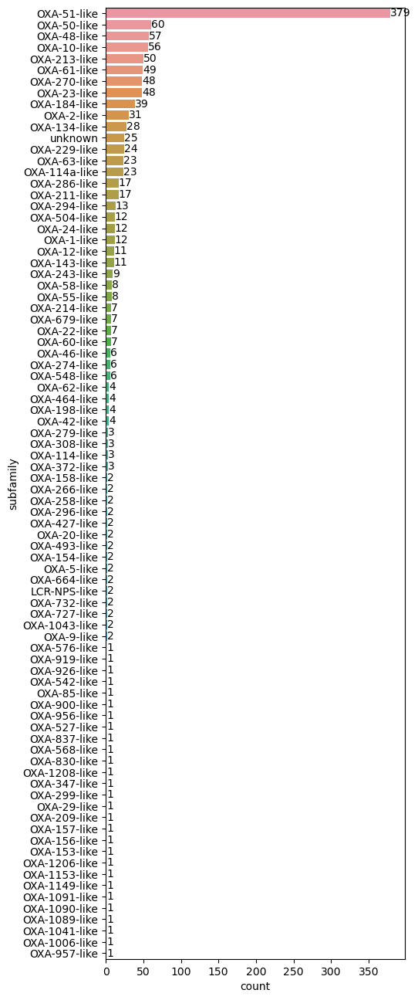

In [30]:
print(f"total number of subfams: {sbl_d.subfamily.nunique()}")

plt.figure(figsize=(5,16))
ax = sns.countplot(sbl_d, 
                   y="subfamily", order=pd.value_counts(sbl_d.subfamily).index)
ax.bar_label(ax.containers[0], );

In [31]:
def fam_count_plot(df, bla_class):

    # first plot 
    fams = df.groupby("protein_family").count().iloc[:,[0]]
    fams = fams.reset_index()
    fams = fams.rename(columns={"protein_family": "family", "#name":"number"})
    fams = fams.sort_values("number", ascending=False)
    fams_top18 = fams.head(18)
    print(f"Families: {fams_top18.family.to_list()}")
    
    fig = plt.figure(figsize=(14, 5))
    ax1 = fig.add_subplot(121)
    ax = sns.barplot(data=fams_top18, x="number", y="family", color="salmon", ax=ax1)
    plt.xlabel("Number of sequences in the family")
    plt.ylabel("")
    ax1.set_title("Top 18 most abundant protein families")
    ax1.grid(alpha=0.4, linestyle="--")
    ax1.bar_label(ax.containers[0], size=8)
    sns.despine(trim=True, offset=2)
    
    # second plot
    fams_counts = df.groupby("protein_family").size().reset_index(name='counts')
    bins = [0, 1, 5, 10, 50, 100, float('inf')]  
    labels = ['1', '2-5', '6-10', '11-50', '51-100', '100+']
    fams_counts['category'] = pd.cut(fams_counts['counts'], bins=bins, labels=labels, right=True)  
    fams_counts_agg = fams_counts.groupby('category').size().reset_index(name='freq')

    ax2 = fig.add_subplot(122)
    sns.barplot(data=fams_counts_agg, x='category', y='freq', color='cornflowerblue', ax=ax2)
    plt.xlabel('Number of sequences in the family')
    plt.ylabel('Frequency')
    ax2.set_title('Frequency for all protein families')
    ax2.grid(alpha=0.4, linestyle='--')
    ax2.bar_label(ax2.containers[0], size=10)
    sns.despine(trim=True, offset=2)
    
    plt.suptitle(bla_class)
    plt.tight_layout()
    plt.show()  

Families: ['BcI', 'CTX-M', 'BcIII', 'TEM', 'SHV', 'L2', 'PC1', 'PenB', 'KPC', 'CGA', 'PenF', 'CARB', 'SDA', 'OKP', 'OXY', 'CfxA', 'LEN', 'GES']


/tmp/ipykernel_24344/4130489253.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



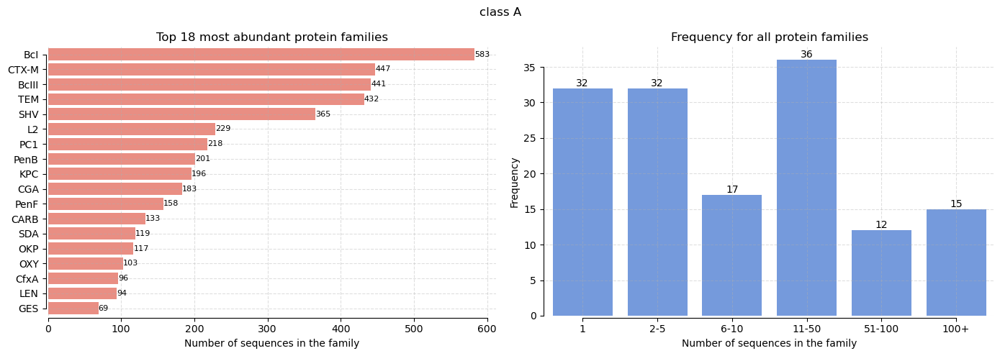

In [32]:
fam_count_plot(sbl_a[~sbl_a.protein_family.str.contains("Unk")], "class A")

Families: ['EC', 'PDC', 'ADC', 'ACT', 'CMY', 'SRT', 'YEC', 'MIR', 'Ear', 'DHA', 'MOX', 'CMH', 'ASA3', 'FOX', 'CSA', 'OCH', 'ACC', 'AQU']


/tmp/ipykernel_75095/4130489253.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



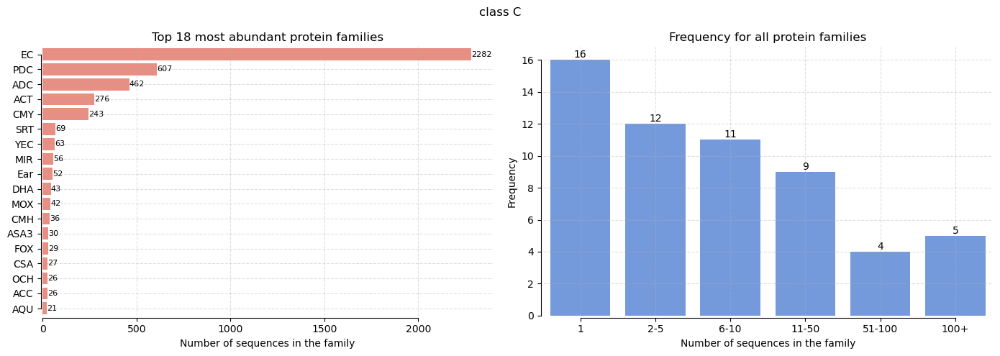

In [11]:
fam_count_plot(sbl_c[~sbl_c.protein_family.str.contains("Unk")], "class C")

Families: ['OXA', 'CDD', 'BPU', 'BSD', 'BSU', 'BAD', 'BAT', 'BOC', 'BED', 'BEN', 'RSD2', 'AFD', 'CPD', 'LCR', 'NOD', 'NPS', 'CEMC18', 'RAD']


/tmp/ipykernel_75095/4130489253.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



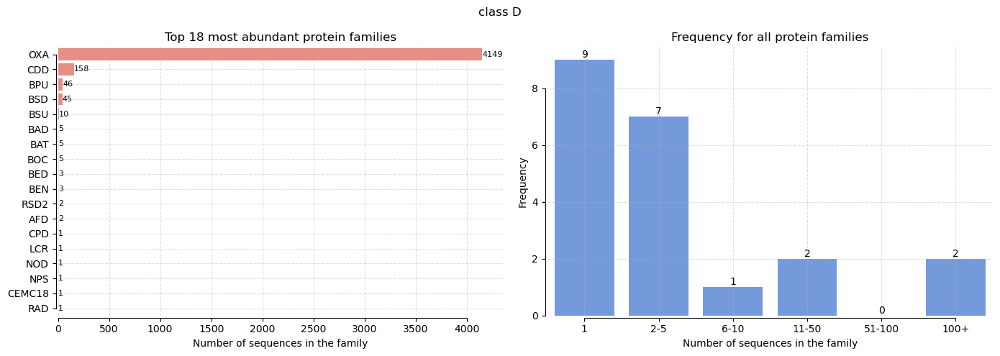

In [12]:
fam_count_plot(sbl_d[~sbl_d.protein_family.str.contains("Unk")], "class D")

Families: ['CphA', 'BcII', 'IMP', 'VIM', 'NDM', 'IND', 'BlaB', 'CfiA', 'CGB', 'PFM', 'MUS', 'TTU', 'CVI', 'PST', 'EBR', 'YEM', 'AFM', 'CHM']


/tmp/ipykernel_75095/4130489253.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



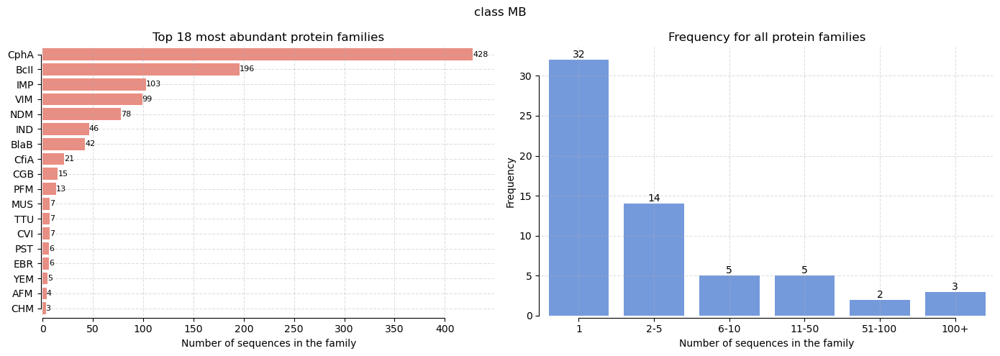

In [13]:
fam_count_plot(mbl_mb[~mbl_mb.protein_family.str.contains("Unk")], "class MB")

Families: ['SER', 'L1', 'BJP', 'GOB', 'THIN', 'RM3', 'CSR', 'CAR', 'ESP', 'POM', 'AIM', 'SPR', 'CAU', 'SMB', 'CPS', 'FEZ', 'PEDO', 'MIM']


/tmp/ipykernel_75095/4130489253.py:26: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/home/gama/anaconda3/envs/bio/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



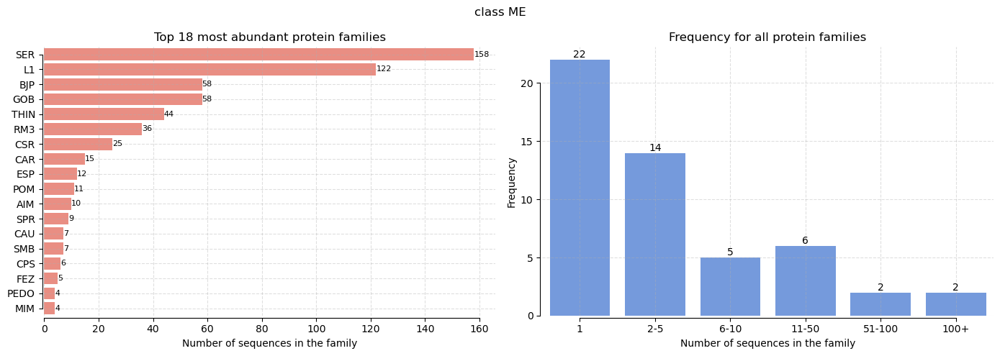

In [14]:
fam_count_plot(mbl_me[~mbl_me.protein_family.str.contains("Unk")], "class ME")

In [33]:
# do a copy of dfs
sbl_a2  = sbl_a.copy()
sbl_c2  = sbl_c.copy()
sbl_d2  = sbl_d.copy()
mbl_mb2 = mbl_mb.copy()
mbl_me2 = mbl_me.copy()

sbl_d2['subfamily'] = sbl_d2['subfamily'].fillna('Unknown')

In [34]:
def custom_plot(data, col, colors, title):
    
    # get most abundant cats 
    top = data[col].value_counts().nlargest(9).index
    data['top'] = data[col].apply(lambda x: x if x in top else 'no top')
    
    # sort 
    ordered_categories = data['top'].value_counts().index
    data = data.set_index('top').loc[ordered_categories].reset_index()

    # plot 
    plt.figure(figsize=(6,5))
    ax = sns.scatterplot(data=data, x=x, y=y, hue="top", palette=colors, edgecolor="none", alpha=0.9)
    
    # legend 
    h, l = ax.get_legend_handles_labels()
    counts = data["top"].value_counts().reindex(l)
    l = [f'{yn} ({c})' for yn,c in counts.items()]

    # axis
    ax.legend(h,l, frameon=False, loc='center left', bbox_to_anchor=(-0.05, -0.1), ncols=3)
    ax.set_frame_on(False)
    ax.grid(alpha=0.3, linestyle='--')
    ax.set_axisbelow(True)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.tick_params(axis='both', colors='w')
    ax.set_title(title)
    plt.show()

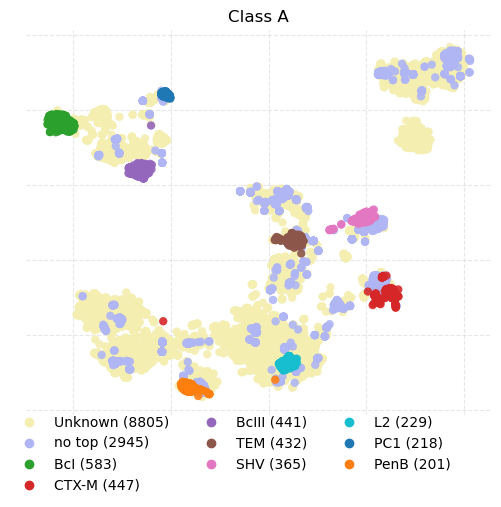

In [40]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl_a2, "protein_family", colors, "Class A")

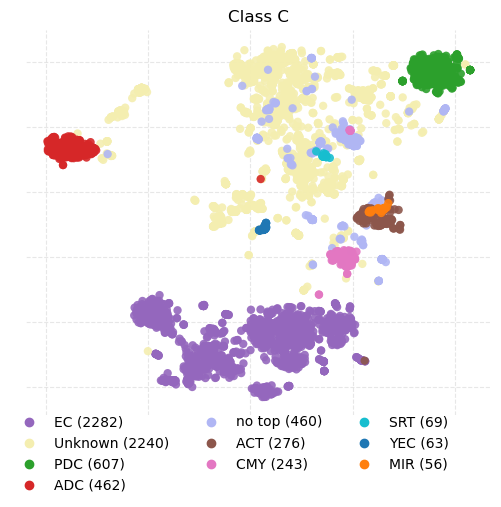

In [43]:
colors = [
        '#9467bd',  # complementary
        '#F4EEB0',  # pale yellow
        '#2ca02c',  # green
        '#d62728',  # red
        '#b0b6f4',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl_c2, "protein_family", colors, "Class C")

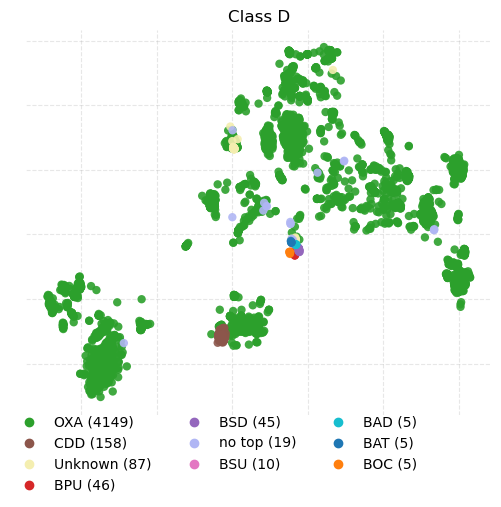

In [46]:
colors = [
        '#2ca02c',  # gren
        '#8c564b',  # complementary
        '#F4EEB0',  # 
        '#d62728',  # red
        '#9467bd',  # purple
        '#b0b6f4',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl_d2, "protein_family", colors, "Class D")

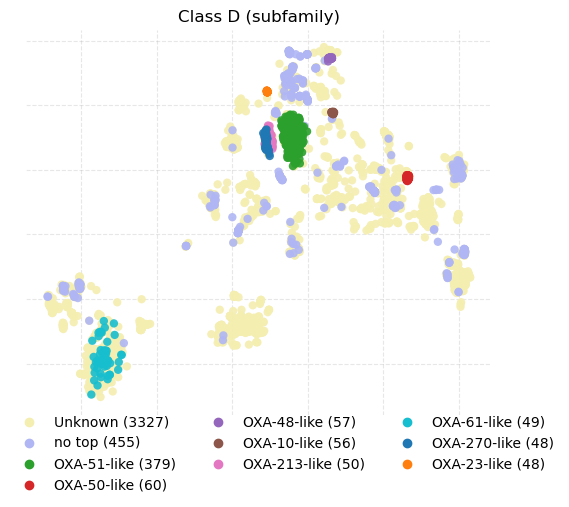

In [47]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl_d2, "subfamily", colors, "Class D (subfamily)")

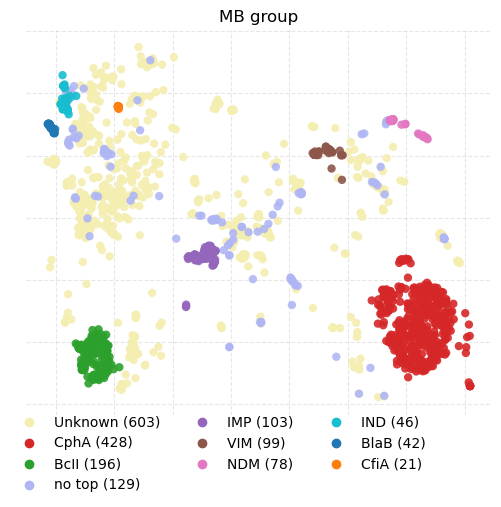

In [49]:
colors = [
        '#F4EEB0',  # pale yellow
        '#d62728',  # red
        '#2ca02c',  # green
        '#b0b6f4',  # 
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl_mb2, "protein_family", colors, "MB group")

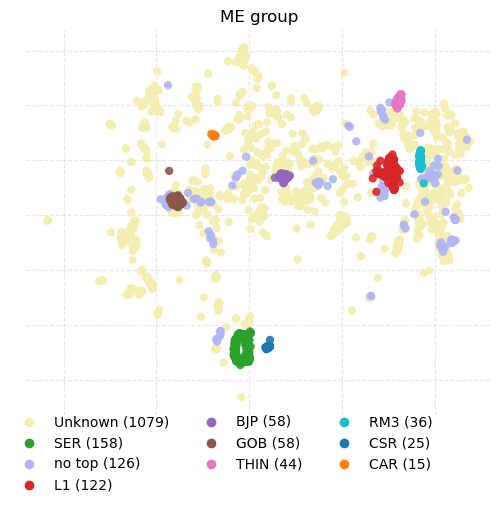

In [51]:
colors = [
        '#F4EEB0',  # pale yellow
        '#2ca02c',  # complementary
        '#b0b6f4',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl_me2, "protein_family", colors, "ME group")